## 예약 취소 예측
### : 예약이 완료된 시점에서 이용 가능한 정보만으로 고객이 예약을 취소할 것인지 예측할 수 있느냐

#### 초기 셋팅

In [5]:
# libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
from datetime import datetime as dt, timedelta, date
from dateutil.relativedelta import relativedelta
import statsmodels.api as sm
import calendar
from scipy.stats import mannwhitneyu, ttest_ind, ttest_rel
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV, cross_val_score
import math
import statsmodels.api as sm
from statsmodels.formula.api import ols


# plotting options
%matplotlib inline

#### 데이터 불러오기

In [6]:
bookings=pd.read_csv("D:/사용자/Desktop/2022-2/hotel_bookings.csv",parse_dates=True)

In [7]:
from pandas_profiling import ProfileReport

In [8]:
profile=ProfileReport(bookings,title='Hotel Bookings Data Profile Report', html={'style':{'full_width':True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Wrangling /cleaning (데이터 정리 및 정제)

In [3]:
# 시계열 데이터 그릴 목적으로 미리 정리
ordered_months = ["January", "February", "March", "April", "May", "June", "July", "August", "September", 
                 "October", "November", "December"]

ordered_rooms = np.sort(bookings.assigned_room_type.unique())

# month mapping (숫자를 월 이름으로)
month_mapping = {v: k for k,v in enumerate(calendar.month_name)}

In [4]:
# 도착(연,월,일)
bookings["arrival_date"] = bookings["arrival_date_year"].astype(str) + bookings["arrival_date_month"] + bookings["arrival_date_day_of_month"].astype(str)
bookings["arrival_date"] = bookings["arrival_date"].apply(lambda x: dt.strptime(x, "%Y%B%d"))

# (평일 + 주말) 체류 기간
bookings['length_of_stay'] = bookings['stays_in_weekend_nights'] + bookings['stays_in_week_nights']

# 체류 기간의 간격
bookings['los_int'] = pd.cut(bookings.length_of_stay, bins = range(1,30, 2))

# 출발일
bookings['departure_date'] = bookings.apply(lambda x: x.arrival_date + timedelta(days = x.length_of_stay), axis = 1)

# 예약일
bookings['booking_date'] = bookings.apply(lambda x: x.arrival_date - timedelta(days = x.lead_time), axis = 1)
bookings['booking_month'] = bookings['booking_date'].apply(lambda x: x.strftime('%b'))

# revenue = adr * length of stay (수익 = (일일 숙박 가격) x (숙박 일 수)
bookings['revenue'] = [los * adr if los > 0 else adr for los, adr in zip(bookings['length_of_stay'], bookings['adr'])]

# lead_time_weeks (평일 lead_time)
bookings['lead_time_weeks'] = bookings['lead_time'].apply(lambda x: x // 7)

# weekday check in and check out
bookings['weekday_checkin'] = bookings['arrival_date'].dt.weekday
bookings['weekday_checkout'] = bookings['departure_date'].dt.weekday


# 'group' 변수(열) 생성
bookings['group'] = bookings.market_segment == "Groups"

#### 변수(열) 확인

In [5]:
bookings.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'arrival_date',
       'length_of_stay', 'los_int', 'departure_date', 'booking_date',
       'booking_month', 'revenue', 'lead_time_weeks', 'weekday_checkin',
       'weekday_checkout', 'group'],
      dtype='object')

#### 예약 취소 비율

In [6]:
bookings.is_canceled.mean()

0.37041628277075134

#### 호텔별 예약 취소 비율

In [7]:
bookings.groupby("hotel")['is_canceled'].mean()

hotel
City Hotel      0.417270
Resort Hotel    0.277634
Name: is_canceled, dtype: float64

#### 취소율 그래프

In [11]:
def plot_cancel_prop(df, var, grouping_var = "hotel", aspect = 1, rot = 0):
    
    '''
    Categorical 차트를 생성하기 위한 function
    - subplot을 그룹화하여 만들기 위함.
    
    input
    - df : graph를 만들 data를 가져오는 Dataframe
    - var : 결과를 그룹화할 변수
    - grouping_var : subplot을 생성하기 위한 변수
    - aspect : plot 너비
    - rot : x 축 회전
    
    output
    - show a graph
    '''
    
    # computes variable categories proportion
    prop_categories = df[var].value_counts() / sum(df[var].value_counts())
    
     # creates plot               
    g = sns.catplot(x = var, y = 'is_canceled',
                                        data = df, kind = "bar", col = grouping_var,
                                        col_wrap = 2, aspect = aspect)
    
    # rotates x axis labels
    g.set_xticklabels(rotation= rot)
    
    return prop_categories, g


#### Is repeated guest (재방문 고객인가)

(0    0.968088
 1    0.031912
 Name: is_repeated_guest, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x1a4fe6ab5b0>)

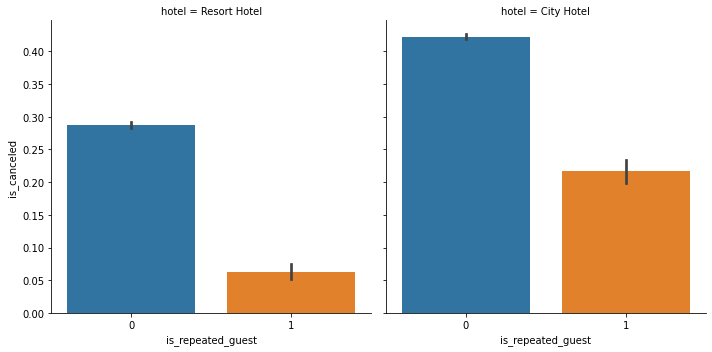

In [12]:
plot_cancel_prop(bookings, "is_repeated_guest")

##### : 취소하는 사람들은 거의 대부분 처음 방문하는 새로운 고객. 그러므로 취소를 예측하는 큰 가치 있는 변수가 아니다.

#### Previous cancelations ( 이번 예약 전에 취소된 예약 건수)

In [9]:
bookings.previous_cancellations.value_counts()

0     112906
1       6051
2        116
3         65
24        48
11        35
4         31
26        26
25        25
6         22
19        19
5         19
14        14
13        12
21         1
Name: previous_cancellations, dtype: int64

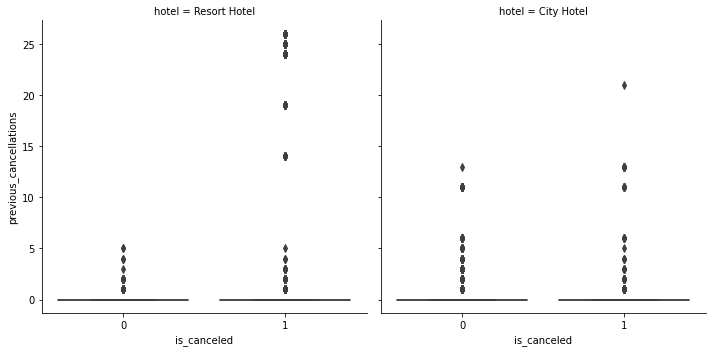

In [10]:
sns.catplot(x = "is_canceled", y = "previous_cancellations", data = bookings, kind = "box", col = "hotel")

##### 관계가 있는 것처럼 보이지만 너무 비대칭적이다.

In [11]:
bookings['has_previous_cancellations'] = bookings.previous_cancellations > 0
bookings.groupby(['hotel', 'has_previous_cancellations']).agg({'is_canceled': 'mean'})

is_canceled
hotel        has_previous_cancellations             
City Hotel   False                          0.379816
             True                           0.931156
Resort Hotel False                          0.261722
             True                           0.843836

In [12]:
bookings.groupby('hotel').agg({'has_previous_cancellations': 'mean'})

,has_previous_cancellations
hotel,
City Hotel,0.067931
Resort Hotel,0.027334


(False    0.945691
 True     0.054309
 Name: has_previous_cancellations, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x23008ee5f10>)

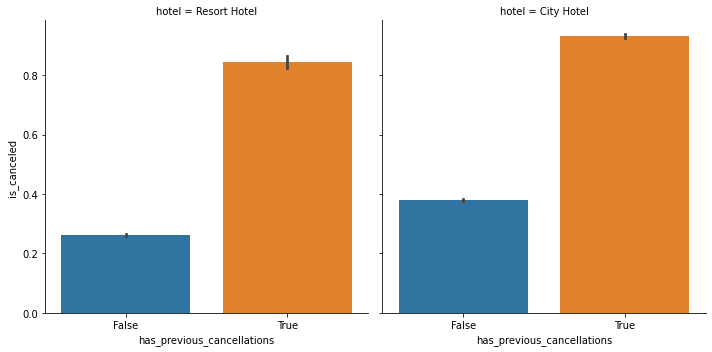

In [13]:
plot_cancel_prop(bookings, "has_previous_cancellations")

##### : 이전에 취소한 적이 있는 고객들이 훨씬 더 취소하는 경향이 있는 것 같음. 하지만 이 고객들은 전체 예약 수의 5%에 불과함.

#### Reserved room type (객실 타입)

(A    0.720278
 D    0.160826
 E    0.054737
 F    0.024265
 G    0.017539
 B    0.009364
 C    0.007806
 H    0.005034
 P    0.000101
 L    0.000050
 Name: reserved_room_type, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x23003322fa0>)

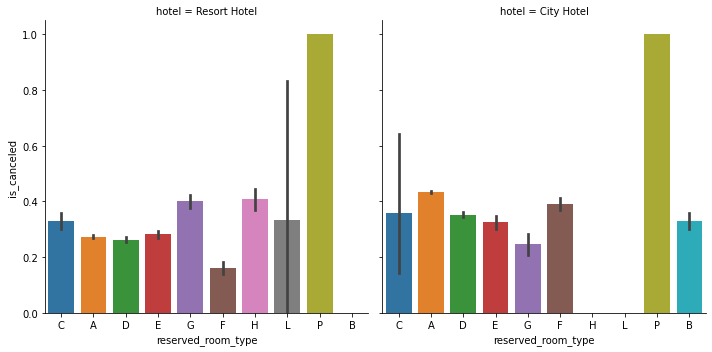

In [14]:
plot_cancel_prop(bookings, "reserved_room_type")

##### - 예약하는 전체 객실 중 'P' 타입의 객실의 비율이 굉장히 낮음에도 불구하고 , 100% 취소하는 것을 보고 이상함을 느껴..'P' 타입 객실을 확인해본 결과 lead_time, revenue가 모두 0인 것을 확인하고 무엇인가의 이유로 객실을 예약했다고 생각할 수 있다.
##### - 'P'를 제외하고 보더라도 큰 차이가 없는 것을 확인할 수 있다. 그러므로 'P' 만 제외시키면 될 듯 하다

In [15]:
bookings[bookings.reserved_room_type == "P"]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,has_previous_cancellations
4127,Resort Hotel,1,0,2016,February,8,15,0,0,0,...,NaN,383.0,0,Transient,0.0,0,0,Canceled,2016-02-15,False
9376,Resort Hotel,1,0,2016,November,48,21,0,0,0,...,NaN,386.0,0,Group,0.0,0,0,Canceled,2016-11-21,False
60651,City Hotel,1,0,2016,November,47,17,4,11,0,...,NaN,279.0,0,Transient,0.0,0,0,Canceled,2016-11-17,False
61244,City Hotel,1,0,2016,December,50,6,0,0,0,...,NaN,279.0,0,Transient,0.0,0,0,Canceled,2016-12-06,False
61245,City Hotel,1,0,2016,December,50,6,0,0,0,...,NaN,279.0,0,Transient,0.0,0,0,Canceled,2016-12-06,False
61249,City Hotel,1,0,2016,December,50,6,0,0,0,...,NaN,279.0,0,Transient,0.0,0,0,Canceled,2016-12-06,False
65907,City Hotel,1,0,2017,April,15,10,0,0,0,...,NaN,279.0,0,Transient,0.0,0,0,Canceled,2017-04-10,False
65908,City Hotel,1,0,2017,April,15,10,0,0,0,...,NaN,279.0,0,Transient,0.0,0,0,Canceled,2017-04-10,False
65909,City Hotel,1,0,2017,April,15,10,0,0,0,...,NaN,279.0,0,Transient,0.0,0,0,Canceled,2017-04-10,False
65910,City Hotel,1,0,2017,April,15,10,0,0,0,...,NaN,279.0,0,Transient,0.0,0,0,Canceled,2017-04-10,False


In [16]:
bookings = bookings[bookings.reserved_room_type != "P"]

#### lead time ( 예약한 날짜와 호텔에 도착한 날짜의 간격)

In [84]:
cancel_lead_time = bookings.groupby(['hotel', 'lead_time_weeks']).agg({'is_canceled': 'mean'}).reset_index()
cancel_lead_time.head()

,hotel,lead_time_weeks,is_canceled
0,City Hotel,0,0.118725
1,City Hotel,1,0.234020
2,City Hotel,2,0.296690
3,City Hotel,3,0.357527
4,City Hotel,4,0.391850


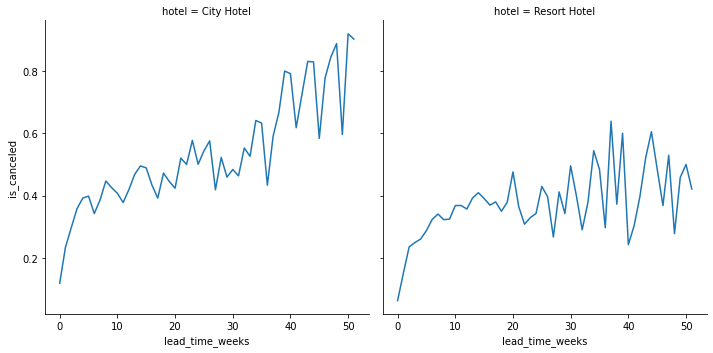

In [19]:
sns.relplot(x = "lead_time_weeks", y = "is_canceled", 
            data = cancel_lead_time[cancel_lead_time.lead_time_weeks < 52] , col = "hotel", col_wrap = 2, kind = "line")

##### city hotel이 resort hotel보다 더 뚜렷하게 보이지만, 두 호텔 모두 lead_time_weeks와 취소는 positive한 결과를 보여준다.

#### Deposit type (보증금 유형)

(No Deposit    0.876451
 Non Refund    0.122192
 Refundable    0.001357
 Name: deposit_type, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x2300f3883d0>)

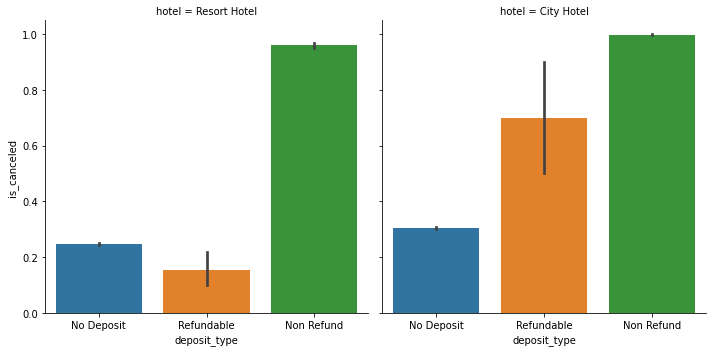

In [20]:
plot_cancel_prop(bookings, "deposit_type")

##### Non Refund(환불이 불가능한 요금) 예약은 훨씬 더 많이 취소된다. adr(평균 일일 숙박비) 와 관련이 있을 것 같아서 다음과 같이 수행했다.

In [21]:
bookings.groupby(['hotel', 'deposit_type'])['adr'].mean()

hotel         deposit_type
City Hotel    No Deposit      107.674593
              Non Refund       93.135309
              Refundable      114.977500
Resort Hotel  No Deposit       96.340759
              Non Refund       66.224532
              Refundable       70.749507
Name: adr, dtype: float64

#####  확실히 Non Refund(환불이 불가능한 요금)이 adr이 낮은 것을 확인할 수 있다.

#### Agent (예약한 여행사 코드)

In [22]:
agent_distrib = (bookings.agent.value_counts().sort_values(ascending = False) / sum(bookings.agent.value_counts()))
agent_distrib.head(10)

9.0      0.310150
240.0    0.135099
1.0      0.069782
14.0     0.035323
7.0      0.034343
6.0      0.031926
250.0    0.027851
241.0    0.016701
28.0     0.016167
8.0      0.014692
Name: agent, dtype: float64

In [25]:
def sort_categories_distrib(df, var):
    
    '''
    Dataframe에서 객체 열의 각 범주에 상대 빈도와 누적 상대 빈도를 할당.
    
    input
    - df : 정렬할 열이 있는 Dataframe
    - var : 정렬할 열
    
    output
    - 정렬된 상대적인 빈도를 가진 Dataframe
    '''
    
    # 빈도를 가지고 있는 정렬된 Series
    sorted_categories = df[var].value_counts().sort_values(ascending = False)
    
    # 상대 빈도를 계산
    sorted_categories = pd.DataFrame(data = sorted_categories / sum(sorted_categories)).rename(columns = {var:"f"})
   
    # 누적 상대빈도를 계산
    sorted_categories['F'] = sorted_categories.f.cumsum()
    
    return sorted_categories

In [26]:
def group_main_categories(df, var, n_categories):
    
    '''
    object column의 빈도가 낮은 범주를 Dataframe에서 그룹화하여 "기타" 값을 할당.
    sort_categories_distribute 함수를 사용할 것.
    
    input
    -df : 그룹화할 column이 있는 Dataframe
    -var : column에서 group으로
    -n_categories : 그룹화되지 않은 가장 frequent categories
    
    
    '''
    
    # 가장 빈도가 높은 범주를 가져오기
    main_categories = sort_categories_distrib(df, var).head(n_categories).index
    
    # 가장 빈도가 높은 범주에 속하지 않는 경우의 그룹 범주
    return [categorie if categorie in main_categories else "other" for categorie in df[var]]

In [27]:
bookings['agent_grouped'] = group_main_categories(bookings, "agent", 6)

C:\Users\yooob\AppData\Local\Temp\ipykernel_21316\3739090657.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bookings['agent_grouped'] = group_main_categories(bookings, "agent", 6)


(other    0.467716
 9.0      0.267729
 240.0    0.116621
 1.0      0.060237
 14.0     0.030491
 7.0      0.029645
 6.0      0.027560
 Name: agent_grouped, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x2300f37e070>)

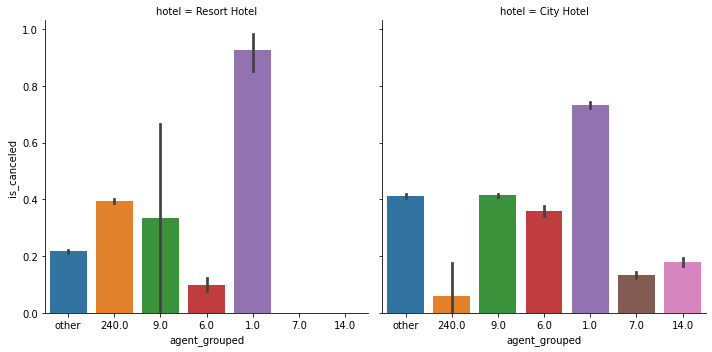

In [28]:
plot_cancel_prop(bookings, 'agent_grouped')

##### - agent가 너무 많아서 상위 6개를 Grouping 해여 그래프를 그려보았다. 
##### - agent '1' 이 가장 많이 취소한다는 것을 확인할 수 있다.

#### Company ( 예약한 회사 코드)

In [29]:
sort_categories_distrib(bookings, "company").head(10)

,f,F
40.0,0.136585,0.136585
223.0,0.115515,0.252100
67.0,0.039340,0.291440
45.0,0.036835,0.328275
153.0,0.031678,0.359953
174.0,0.021954,0.381907
219.0,0.020775,0.402682
281.0,0.020333,0.423015
154.0,0.019596,0.442611
405.0,0.017534,0.460144


In [30]:
bookings['company_grouped'] = group_main_categories(bookings, 'company', 6)

C:\Users\yooob\AppData\Local\Temp\ipykernel_21316\4082443404.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bookings['company_grouped'] = group_main_categories(bookings, 'company', 6)


(other    0.978287
 40.0     0.007765
 223.0    0.006567
 67.0     0.002237
 45.0     0.002094
 153.0    0.001801
 174.0    0.001248
 Name: company_grouped, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x2300f450e20>)

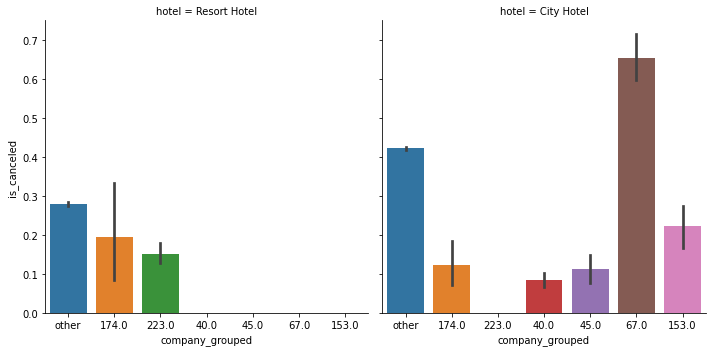

In [31]:
plot_cancel_prop(bookings, "company_grouped")

#####  '40' ,'223' company가 가장 많이 operate 하고 있다. 그리고 city hotel에서 '67' company가 가장 취소 건수가 많다.

#### Children

In [32]:
bookings.children.value_counts()

0.0     110784
1.0       4861
2.0       3652
3.0         76
10.0         1
Name: children, dtype: int64

In [33]:
bookings.groupby(["hotel", "children"])['hotel'].count()

hotel         children
City Hotel    0.0         74210
              1.0          3023
              2.0          2024
              3.0            59
Resort Hotel  0.0         36574
              1.0          1838
              2.0          1628
              3.0            17
              10.0            1
Name: hotel, dtype: int64

(0.0     0.928041
 1.0     0.040721
 2.0     0.030593
 3.0     0.000637
 10.0    0.000008
 Name: children, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x23003c3a760>)

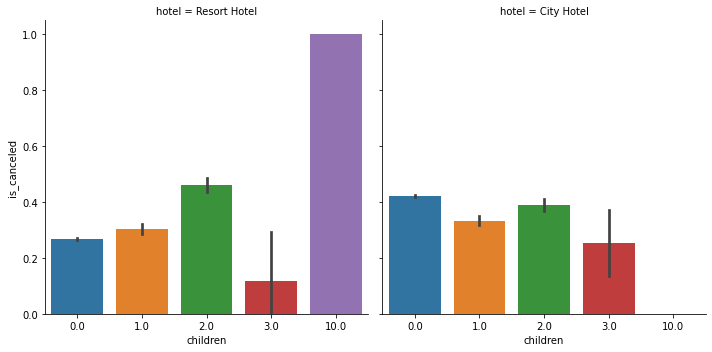

In [34]:
plot_cancel_prop(bookings, "children")

##### 고객들은 두 호텔 모두 Children 없이 방문하는 경우가 많은 것을 볼 수 있다.
##### 그래프를 보면, 아이를 한 명 이상 데리고 방문하는 고객들은 소수에 불과하지만, 취소율은 꽤나 높은 것을 확인할 수 있다.

#### Adult

In [35]:
bookings.adults.value_counts()

2     89680
1     23027
3      6202
0       391
4        62
26        5
27        2
20        2
5         2
40        1
50        1
55        1
6         1
10        1
Name: adults, dtype: int64

#####  커플들이 많이 호텔을 방문하는 것으로 추정할 수 있다.
##### 어른이 0명으로, 어른 없이 방문하는 경우도 꽤나 많음을 알 수 있다. 

(2    0.751718
 1    0.193018
 3    0.051987
 0    0.003277
 Name: adults, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x23003ca6c40>)

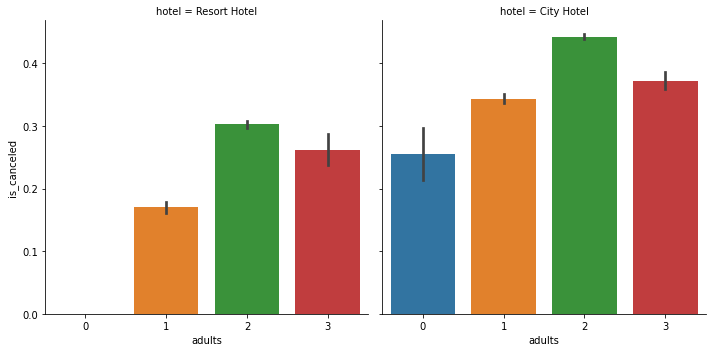

In [36]:
plot_cancel_prop(bookings[bookings.adults < 4], "adults")

##### 혼자 여행하는 사람들은 취소가 적어 보임을 확인할 수 있다. 리조트 호텔에서는 커플 취소율이 꽤 높음을 알 수 있다.

In [37]:
bookings['travels_alone'] = bookings['adults'] <= 1

C:\Users\yooob\AppData\Local\Temp\ipykernel_21316\1037025603.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bookings['travels_alone'] = bookings['adults'] <= 1


#### Meal
##### BB: 조식
##### HB: 조식 and (중식 or 석식)
##### FB:  조식 and 중식 and 석식
##### SC: 아무것도 먹지 않음

(BB           0.773258
 HB           0.121153
 SC           0.089112
 Undefined    0.009792
 FB           0.006685
 Name: meal, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x230102a5910>)

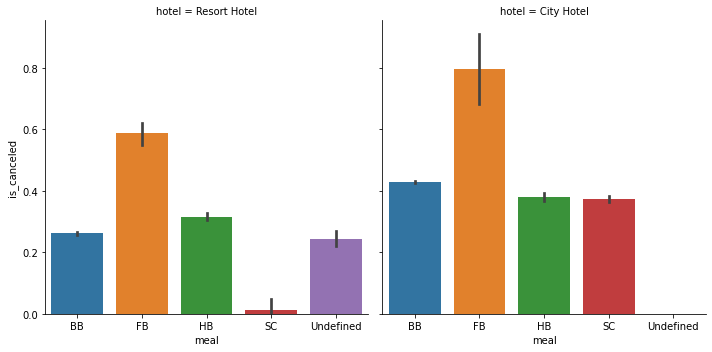

In [38]:
plot_cancel_prop(bookings, "meal")

##### FB(Full Board)의 취소 건수가 가장 높지만, 이 유형의 식사를 선택한 고객의 수는 매우 적다(약 0.7%).

#### Country (고객의 국적)

In [40]:
# 고객 국가의 수
len(bookings.country.unique())

178

In [41]:
# 예약이 많은 국가들만 확인해보자.
sort_categories_distrib(bookings, "country").head(10)

,f,F
PRT,0.408646,0.408646
GBR,0.102010,0.510656
FRA,0.087595,0.598251
ESP,0.072061,0.670311
DEU,0.061287,0.731598
ITA,0.031674,0.763272
IRL,0.028385,0.791657
BEL,0.019697,0.811354
BRA,0.018705,0.830059
NLD,0.017696,0.847754


##### 상위 7개 나라가 호텔의 70%를 예약

In [42]:
bookings['country_grouped'] = group_main_categories(bookings, "country", 7)

C:\Users\yooob\AppData\Local\Temp\ipykernel_21316\3097718948.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bookings['country_grouped'] = group_main_categories(bookings, "country", 7)


(PRT      0.407010
 other    0.211513
 GBR      0.101602
 FRA      0.087244
 ESP      0.071772
 DEU      0.061041
 ITA      0.031547
 IRL      0.028272
 Name: country_grouped, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x230102ab880>)

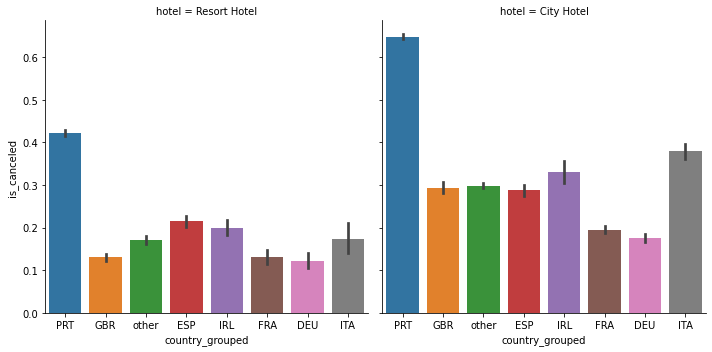

In [43]:
plot_cancel_prop(bookings, 'country_grouped')

##### - 포르투칼 고객들은 예약을 많이 하는 만큼 취소도 많이 하는 경향이 있다 (왜냐하면, Dataset은 포르투칼의 호텔 두 곳이다). 
##### - 그래서  현지인이라는 사실을 나타내기 위해 변수를 따로 생성하였다.

In [44]:
bookings['market_origin_local'] = bookings['country'] == "PRT"

C:\Users\yooob\AppData\Local\Temp\ipykernel_21316\2401357805.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bookings['market_origin_local'] = bookings['country'] == "PRT"


#### Market segment 
##### TA : 여행사
##### TO : 관광 사업자

(Online TA        0.473077
 Offline TA/TO    0.202860
 Groups           0.165952
 Direct           0.105597
 Corporate        0.044347
 Complementary    0.006165
 Aviation         0.001985
 Undefined        0.000017
 Name: market_segment, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x23003c3a790>)

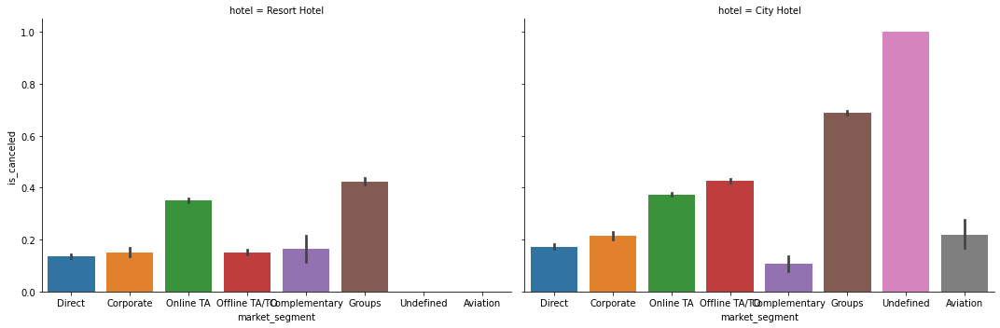

In [45]:
plot_cancel_prop(bookings, "market_segment", aspect = 1.5)

##### group과 online TA가 많이 취소하는 경향이 있고, 확인되지 않은 부분에서도 취소가 많이 발생하고 있다.

#### distribution channel (예약한 방법)

(TA/TO        0.819799
 Direct       0.122669
 Corporate    0.055873
 GDS          0.001617
 Undefined    0.000042
 Name: distribution_channel, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x230081cc280>)

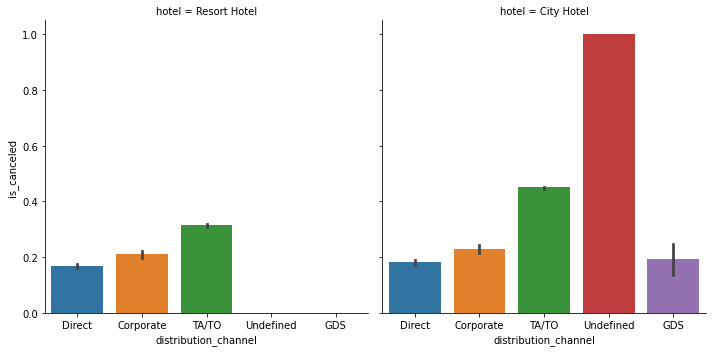

In [46]:
plot_cancel_prop(bookings, "distribution_channel")

##### 두 호텔 모두 TA가 높은 취소율을 보이고 있고, City hotel에 경우 Undefined가 꽤 취소되는 경향을 보임

#### days in waiting list ( 예약일과 확정일 사이 일 수)

In [47]:
bookings.days_in_waiting_list.value_counts()

0      115680
39        227
58        164
44        141
31        127
        ...  
116         1
109         1
37          1
89          1
36          1
Name: days_in_waiting_list, Length: 128, dtype: int64

##### 육안으로 확인해봐도 범주가 128개나 되고, outlier도 존재할 것으로 보임

In [48]:
sort_categories_distrib(bookings, "days_in_waiting_list").head(10)

,f,F
0,0.969023,0.969023
39,0.001902,0.970924
58,0.001374,0.972298
44,0.001181,0.973479
31,0.001064,0.974543
35,0.000804,0.975347
46,0.000787,0.976135
69,0.000746,0.976880
63,0.000695,0.977575
87,0.000670,0.978246


##### 대부분의 고객들이 기다리지 않는다는 것을 알 수 있고, 이에 따라  새로운 변수 'in_waiting_list'를 만들어 대기자 list와 target 변수의 관계를 분석해볼 것이다. 

In [49]:
# 대기자: True
bookings['in_waiting_list'] = bookings['days_in_waiting_list'].apply(lambda x: x > 0)

C:\Users\yooob\AppData\Local\Temp\ipykernel_21316\3048551798.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bookings['in_waiting_list'] = bookings['days_in_waiting_list'].apply(lambda x: x > 0)


(False    0.969023
 True     0.030977
 Name: in_waiting_list, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x2301039caf0>)

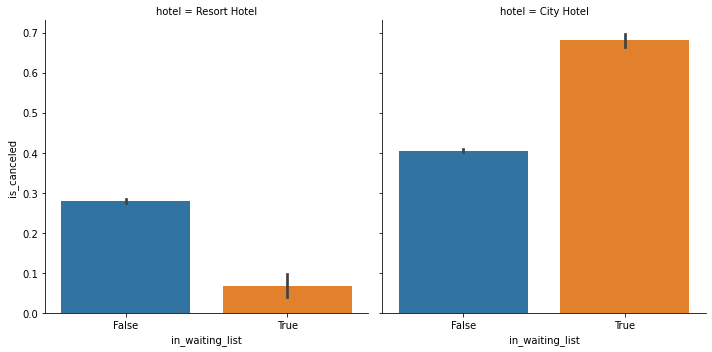

In [50]:
plot_cancel_prop(bookings, "in_waiting_list")

##### 흥미롭게도 서로 상반되는 결과 : City hotel은 대기자 명단에 있는 사람들이 높은 취소율을 보이는 반면, Resort hotel은 그 반대의 결과를 보이고 있다.

#### Customer type (고객의 타입)
##### Transient : 단기 투숙객

(Transient          0.750574
 Transient-Party    0.210458
 Contract           0.034144
 Group              0.004825
 Name: customer_type, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x2300828f610>)

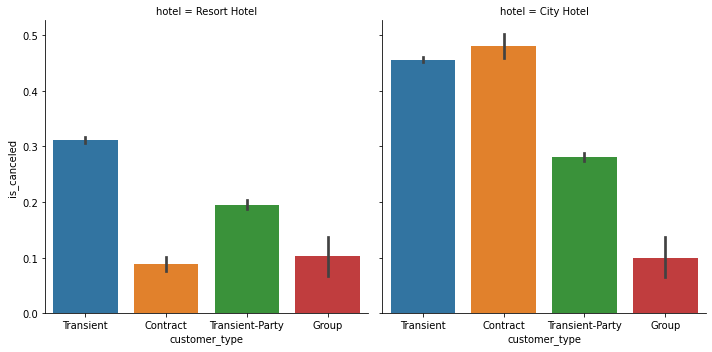

In [52]:
plot_cancel_prop(bookings, "customer_type")

#### Required car parking spaces ( 주차 공간을 요구하는 차량 대수)

(0    0.937878
 1    0.061846
 2    0.000235
 3    0.000025
 8    0.000017
 Name: required_car_parking_spaces, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x23004157c40>)

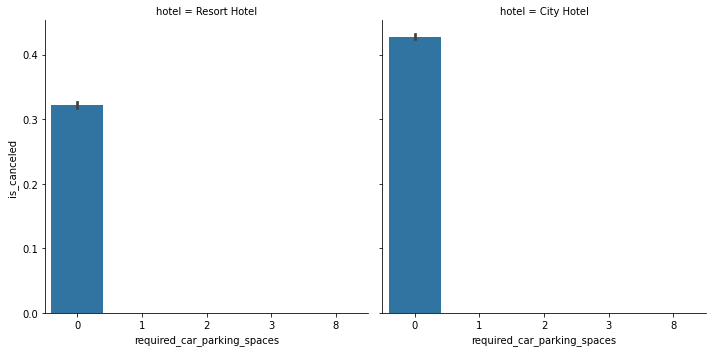

In [53]:
plot_cancel_prop(bookings, "required_car_parking_spaces")

##### 취소 예측에 도움이 안될 듯 보임

#### Total of special requests (요청사항 갯수)

(0    0.588936
 1    0.278326
 2    0.108638
 3    0.020917
 4    0.002848
 5    0.000335
 Name: total_of_special_requests, dtype: float64,
 <seaborn.axisgrid.FacetGrid at 0x2300ff90190>)

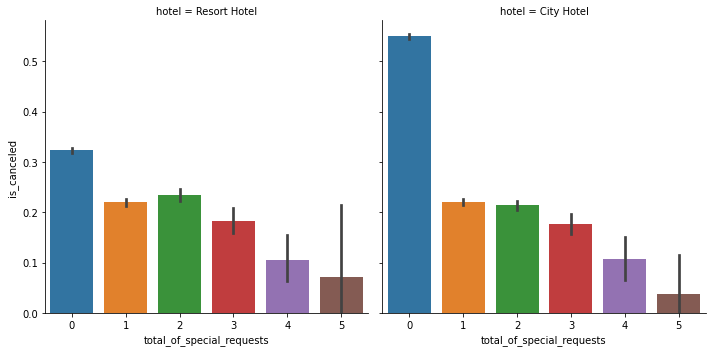

In [54]:
plot_cancel_prop(bookings, "total_of_special_requests")

##### 특별한 요청이 있는 고객들은 평균 이하로 취소하는 경향이 있고, 특별한 요청이 있는 손님이 많을 수록 취소 가능성이 낮아 보인다.

#### ADR (하루 평균 숙박비)

C:\Users\yooob\miniconda3\lib\site-packages\seaborn\axisgrid.py:38: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set(**kwargs)


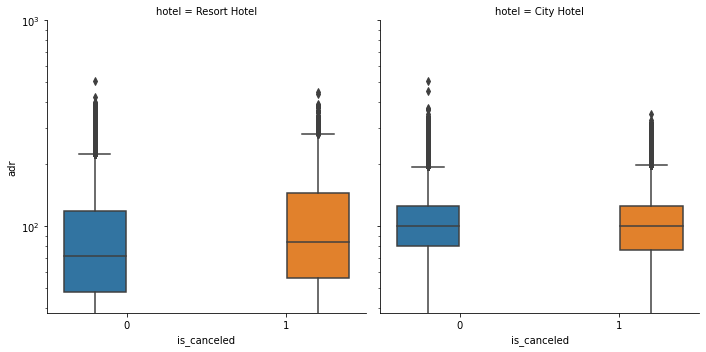

In [55]:
g = sns.catplot(x = "is_canceled", y = "adr", data = bookings, kind = "box", hue = "is_canceled", col = "hotel")
g.set(yscale="log", ylim = (0, 1000))

##### Resort hotel의 예약 취소 고객의 경우 adr이 더 높은 경향이 있다. 아마도 Resort hotel에 차이가 있을 것으로 보인다.

## Modeling
#### 모델링을 위해 변수 선택하기

In [62]:
df_model = bookings[['is_canceled', 'hotel', 'market_origin_local', 'total_of_special_requests', 
                     'lead_time_weeks', 'deposit_type', 'travels_alone', 'agent_grouped', 'is_repeated_guest', 
                     'has_previous_cancellations', 'children', 'market_segment', 
                     'customer_type', 'company_grouped', 'arrival_date_month', 'arrival_date_month', 'booking_month']]

In [63]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119378 entries, 0 to 119389
Data columns (total 17 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   is_canceled                 119378 non-null  int64  
 1   hotel                       119378 non-null  object 
 2   market_origin_local         119378 non-null  bool   
 3   total_of_special_requests   119378 non-null  int64  
 4   lead_time_weeks             119378 non-null  int64  
 5   deposit_type                119378 non-null  object 
 6   travels_alone               119378 non-null  bool   
 7   agent_grouped               119378 non-null  object 
 8   is_repeated_guest           119378 non-null  int64  
 9   has_previous_cancellations  119378 non-null  bool   
 10  children                    119374 non-null  float64
 11  market_segment              119378 non-null  object 
 12  customer_type               119378 non-null  object 
 13  company_groupe

### 결측값 대체
##### 'children' 변수만이 유일하게 결측값이 존재하는데, 4개의 관측치에서 보인다. training 과정에서 영향을 거의 미치지 않을 것으로 보이기 때문에 0으로 채울 것이다. 

In [64]:
df_model['children'] = df_model['children'].fillna(0)

C:\Users\yooob\AppData\Local\Temp\ipykernel_21316\1040189936.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_model['children'] = df_model['children'].fillna(0)


#### Model matrix 와 더미변수(가변수)를 생성

In [65]:
# 반응 변수 추출 및 y-array에 할당
df_response = df_model.drop('is_canceled', axis = 1)
y = df_model['is_canceled']

# 더미변수를 가져와서 X-array에 할당 
X = pd.get_dummies(df_response)

In [66]:
# Data split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .3, random_state = 123)

### Random Forest classifier
##### 본 수업은 머신러닝 수업이 아니기 때문에 여러 모델을 시도하고 고르기보다는 합리적인 결과를 보여줄 수 있는 하나의 모델을 선택하자.

In [67]:
rf = RandomForestClassifier(random_state = 123, oob_score = True)

# Hyperparameters
params_rf = {'n_estimators': [100, 250, 500], 
             'max_features': ['log2', 'auto', 'sqrt']}

# 교차 검증(cross validation)
grid_rf = GridSearchCV(estimator = rf, param_grid = params_rf, verbose = 1, n_jobs = 2)

In [68]:
# model 학습하기
grid_rf.fit(X_train, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


GridSearchCV(estimator=RandomForestClassifier(oob_score=True, random_state=123),
             n_jobs=2,
             param_grid={'max_features': ['log2', 'auto', 'sqrt'],
                         'n_estimators': [100, 250, 500]},
             verbose=1)

In [69]:
# getting best model and OOB cv score
best_model = grid_rf.best_estimator_
best_model.oob_score_

0.8499234119955962

In [70]:
best_model

RandomForestClassifier(n_estimators=250, oob_score=True, random_state=123)

In [71]:
# Best model fit on entire training set
best_model.fit(X_train, y_train)

RandomForestClassifier(n_estimators=250, oob_score=True, random_state=123)

In [72]:
# Model prediction
y_pred_rf = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:,1]

In [73]:
# Model evaluation
roc_auc_score(y_test, y_pred_proba)

0.9205637124093025

In [74]:
print(confusion_matrix(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))

[[20219  2344]
 [ 3061 10190]]
              precision    recall  f1-score   support

           0       0.87      0.90      0.88     22563
           1       0.81      0.77      0.79     13251

    accuracy                           0.85     35814
   macro avg       0.84      0.83      0.84     35814
weighted avg       0.85      0.85      0.85     35814



## Feature importance

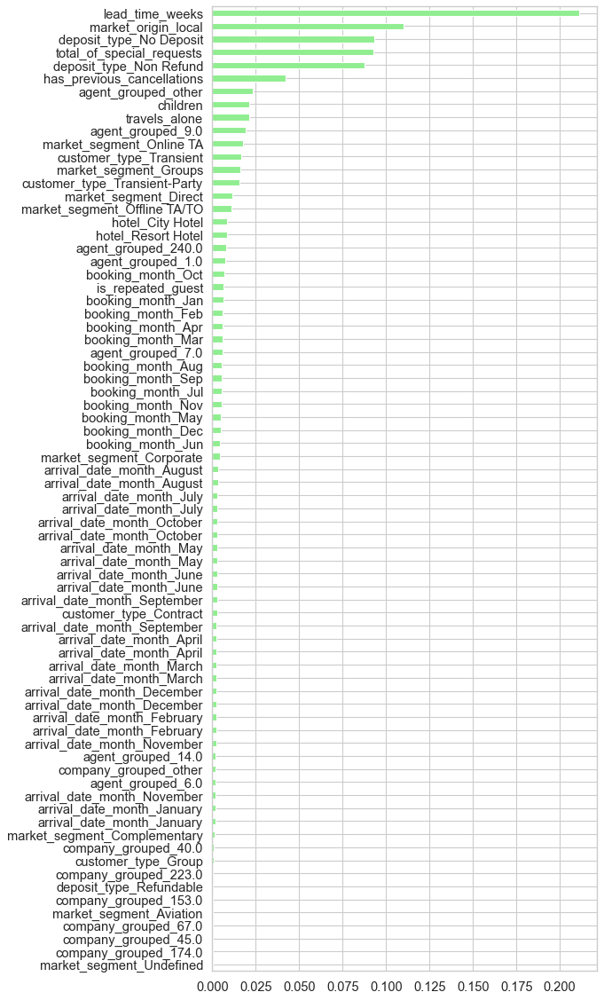

In [75]:
# Sorted Series with feature importance
importances = pd.Series(data=best_model.feature_importances_,
                        index= X_train.columns)

importances_sorted = importances.sort_values()


sns.set( style = "whitegrid", font_scale = 1.2)
fig=plt.figure(figsize=(7, 18), dpi= 80, facecolor='w', edgecolor='k')

# Bar plot with feature imporances
importances_sorted.plot(kind = "barh", color = "lightgreen")
plt.show()

### 상위 4개의 feature importance 시각화

#### lead time

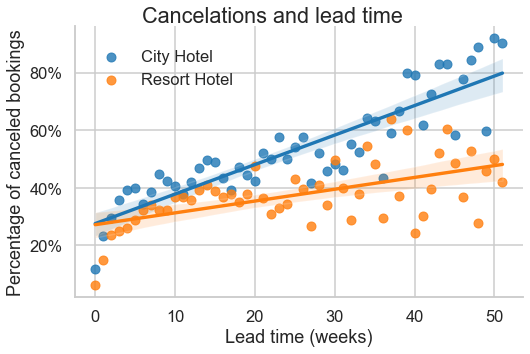

In [76]:
# 'is_canceled' 백분율(%)에 따른 시각화 
cancel_lead_time["is_canceled"] = cancel_lead_time["is_canceled"] * 100

# set parameters 
sns.set_palette("tab10")
sns.set_context("talk")

# Scatter plot
g = sns.lmplot(x = "lead_time_weeks", y = "is_canceled", 
            data = cancel_lead_time[cancel_lead_time.lead_time_weeks < 52] ,
                hue = "hotel", aspect = 1.5, legend = False);
g.ax.set(xlabel = 'Lead time (weeks)', ylabel = "Percentage of canceled bookings")
g.ax.legend(loc = (0.03, 0.75), frameon = False)
g.fig.suptitle("Cancelations and lead time", y = 1)

g.ax.yaxis.set_major_formatter(mtick.PercentFormatter())

#### country of origin

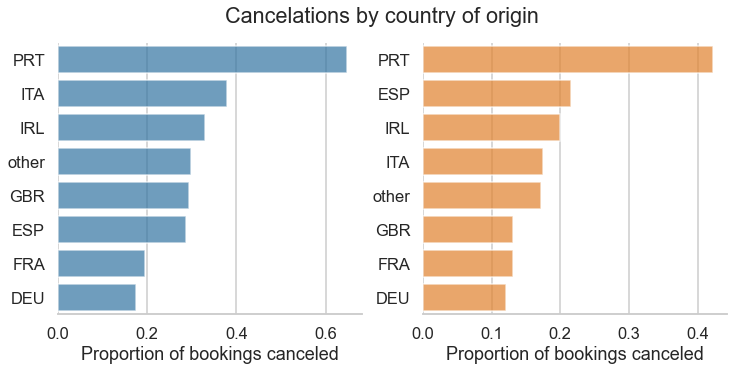

In [81]:
# Bar plot
fig, ax = plt.subplots(1, 2, figsize = (12, 5))

# city hotel_bar plot 그리기
sns.barplot(x = "is_canceled", 
            y = "country_grouped", 
            data = bookings[bookings.hotel == "City Hotel"], 
            color = "#1f77b4",
            order = ["PRT", "ITA", "IRL", "other", "GBR", "ESP", "FRA", "DEU"],
            ci = None,
            alpha = 0.7,
            ax = ax[0])

# Resort hotel_bar plot 그리기
sns.barplot(x = "is_canceled", 
            y = "country_grouped", 
            data = bookings[bookings.hotel == "Resort Hotel"], 
            color = "#ff7f0e",
            order = ["PRT", "ESP", "IRL",  "ITA", "other", "GBR", "FRA", "DEU"],
            ci = None,
            alpha = 0.7,
            ax = ax[1])


# formatting
sns.despine(left = True)
fig.suptitle("Cancelations by country of origin")
ax[0].set(xlabel = "Proportion of bookings canceled", ylabel = None)
ax[1].set(xlabel = "Proportion of bookings canceled", ylabel = None)
sns.set_palette(["#39A7D0", "#36ADA4"])

#### deposit type

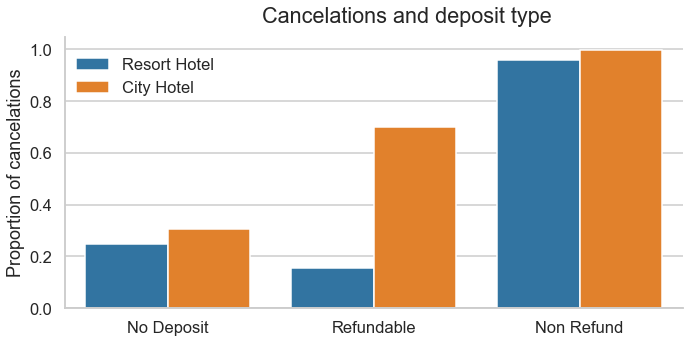

In [82]:
# Bar plot 그리기
g = sns.catplot(x = "deposit_type", 
            y = "is_canceled", 
            data = bookings, 
            kind = "bar", 
            palette = ["#1f77b4", "#ff7f0e"],
            hue = "hotel", 
            aspect = 2,
            ci = None, 
            legend = False)

# formatting
plt.suptitle("Cancelations and deposit type", y = 1.03)
g.set(xlabel = None, ylabel = "Proportion of cancelations")
g.add_legend(loc = (0.1, 0.7))

#### number of special requests

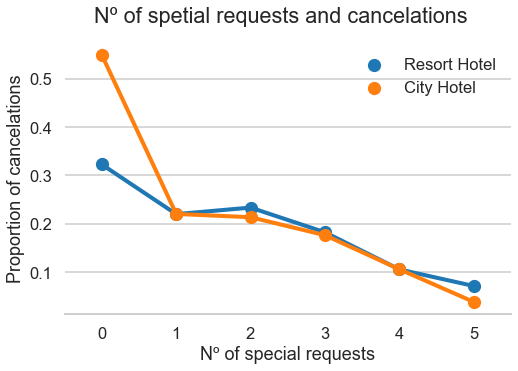

In [83]:
# set parameters
fig, ax = plt.subplots(figsize = (8, 5))
sns.set_context("talk")

# Pointplot 그리기
sns.pointplot(x = "total_of_special_requests", 
              y = "is_canceled", 
              data = bookings, 
              hue = "hotel", 
              palette = ["#1f77b4", "#ff7f0e"], 
              ci = None, 
              legend = False)

# formatting
sns.despine(left = True)
ax.legend(frameon = False)
ax.set(xlabel = "Nº of special requests", ylabel = "Proportion of cancelations")
plt.suptitle("Nº of spetial requests and cancelations")

plt.show()